In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random

In [3]:
df = pd.read_csv("results2feat_50worlds_0.1endA.csv")
df

FileNotFoundError: [Errno 2] No such file or directory: 'results2feat_50worlds_0.1endA.csv'

In [ ]:
results = ["skl", "post_hoc", "uncertain_forest", "random_forest", "lasso", "ridge"]

agg_r = {}

for learner in results:
    agg_r[learner] = [np.mean]

In [4]:
df.groupby(["Features", "World", "n_samples"]).agg(agg_r).reset_index()

NameError: name 'df' is not defined

In [5]:
df = pd.read_csv("results2feat_50worlds_0.1endA.csv")

new = df.groupby(["Features", "World", "n_samples"]).agg(agg_r).reset_index()
new = new[new["n_samples"] == 40].reset_index()
new[["skl", "post_hoc", "uncertain_forest", "random_forest", "lasso", "ridge"]].mean(axis=1).sort_values()
# new.groupby(["Features", "World", "n_samples", "errRange"]).agg(agg_r).reset_index()
# new

FileNotFoundError: [Errno 2] No such file or directory: 'results2feat_50worlds_0.1endA.csv'

### OLD

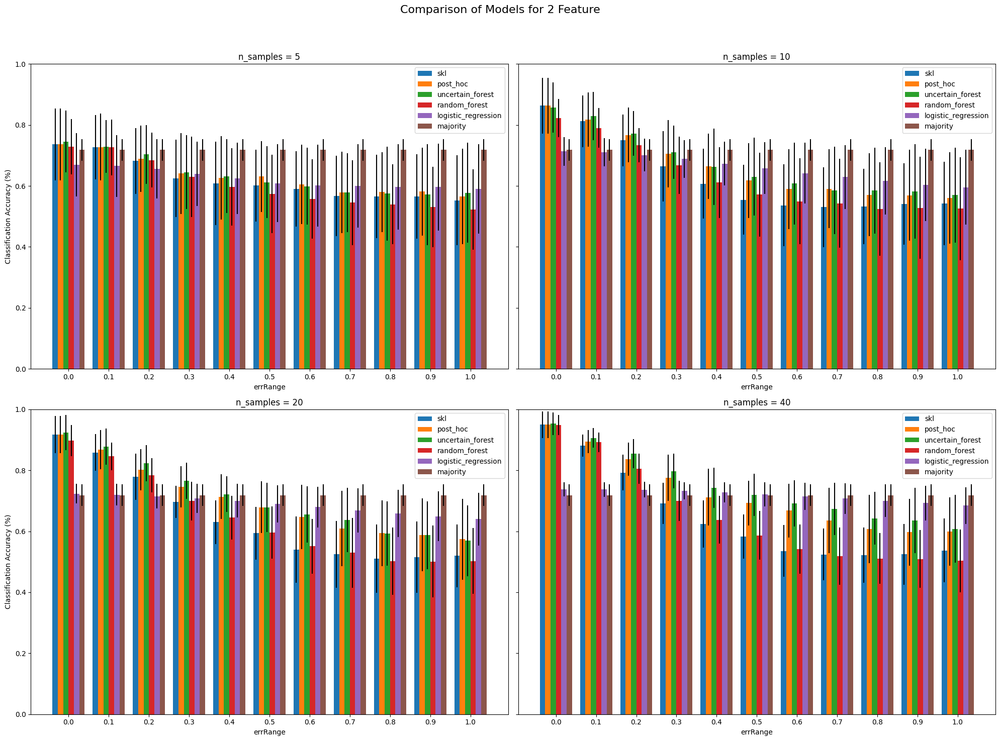

In [10]:
feature = 2
endA = 0.1
clases = 2
results = ["skl", "post_hoc", "uncertain_forest", "random_forest", "logistic_regression", "majority"] #["skl", "post_hoc", "uncertain_forest", "random_forest", "lasso", "ridge"]

# Define aggregation dictionary dynamically based on the selected results
agg_r = {learner: [np.mean, np.std] for learner in results}

# Load and process the data
df = pd.read_csv(f"results{feature}feat_2worlds_{endA}endA_{clases}-clases.csv")
# df = df[df["World"] == 22].reset_index()
df = df.groupby(["Features", "errRange", "n_samples"]).agg(agg_r).reset_index()

# Filter data for the specified feature
feature_data = df[df['Features'] == feature]

# Create a figure with 4 subplots in a 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(20, 15), sharey=True)
fig.suptitle(f'Comparison of Models for {feature} Feature', fontsize=16)

# Flatten axes array to easily iterate over it
axes = axes.flatten()

# Iterate over each sample size and plot
for i, samples in enumerate(np.unique(df["n_samples"])):
    samples_data = feature_data[feature_data['n_samples'] == samples]

    # Prepare data for plotting
    x = samples_data['errRange']
    
    # Calculate the positions for the bars dynamically
    bar_width = 0.8 / len(results)  # Adjust bar width based on the number of results
    bar_positions = [np.arange(len(x)) + j * bar_width for j in range(len(results))]

    # Plot each learner's results dynamically
    for j, learner in enumerate(results):
        means = samples_data[(learner, 'mean')]
        stds = samples_data[(learner, 'std')]
        axes[i].bar(bar_positions[j], means, yerr=stds, width=bar_width, label=learner)
    

    axes[i].set_xlabel('errRange')
    axes[i].set_title(f'n_samples = {samples}')
    axes[i].set_xticks(bar_positions[0] + (len(results) - 1) * bar_width / 2)
    axes[i].set_xticklabels(x)
    axes[i].set_ylim([0, 1])
    axes[i].legend()

# Set the label for the y-axis on the first plot
axes[0].set_ylabel('Classification Accuracy (%)')
axes[2].set_ylabel('Classification Accuracy (%)')

# Adjust layout to prevent overlapping
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()

### New

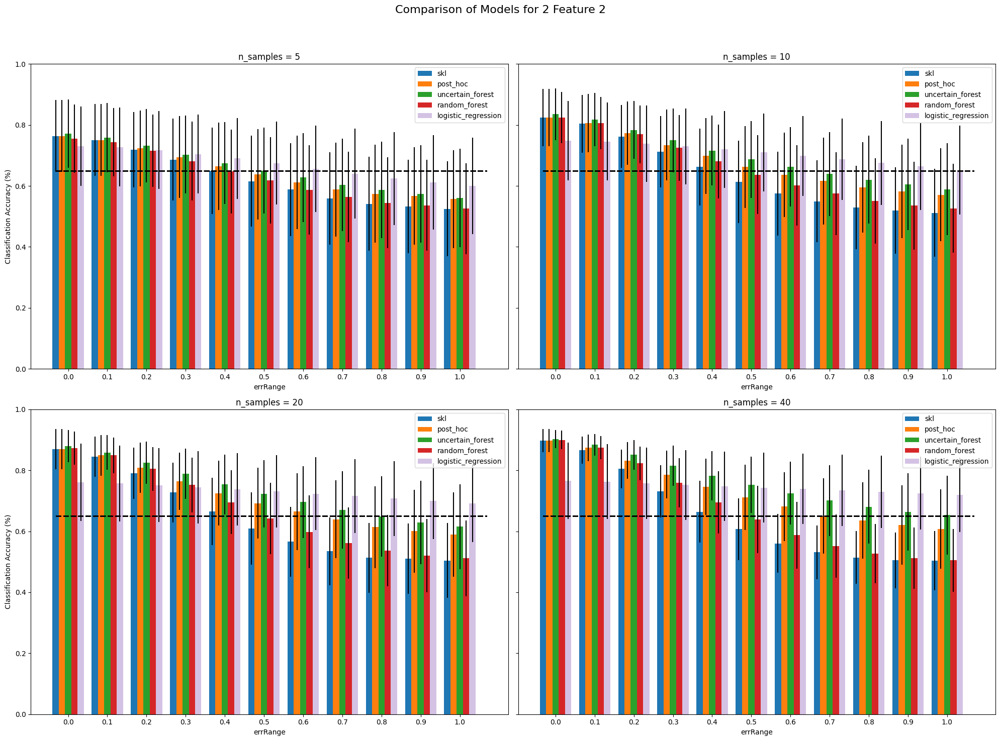

In [9]:
feature = 2
corr = 0.6
endA = 0.3
clases = 2
results = ["skl", "post_hoc", "uncertain_forest", "random_forest", "logistic_regression", "majority"]

# Define aggregation dictionary dynamically based on the selected results
agg_r = {learner: [np.mean, np.std] for learner in results}

# Load and process the data
df = pd.read_csv(f"truefuzzydata0.05-0.1results2feat_50worlds_0.3endA_2-clases.csv")
df = df.groupby(["Features", "errRange", "n_samples"]).agg(agg_r).reset_index()

# Filter data for the specified feature
feature_data = df[df['Features'] == feature]

# Create a figure with 4 subplots in a 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(20, 15), sharey=True)
fig.suptitle(f'Comparison of Models for {feature} Feature {clases}', fontsize=16)

# Flatten axes array to easily iterate over it
axes = axes.flatten()

# Iterate over each sample size and plot
for i, samples in enumerate(np.unique(df["n_samples"])):
    samples_data = feature_data[feature_data['n_samples'] == samples]

    # Prepare data for plotting
    x = samples_data['errRange']
    
    # Exclude 'majority' from bar calculations
    bar_learners = [learner for learner in results if learner != 'majority']
    bar_width = 0.8 / len(bar_learners)  # Adjust bar width based on the number of bar learners
    bar_positions = [np.arange(len(x)) + j * bar_width for j in range(len(bar_learners))]

    # Plot each learner's results dynamically
    for j, learner in enumerate(results):
        means = samples_data[(learner, 'mean')]
        stds = samples_data[(learner, 'std')]

        if learner == 'majority':
            majority_means = means
            majority_stds = stds
            continue
            # Plot 'majority' as a line
        else:
            # For 'logistic_regression', make the bars more transparent
            if learner == 'logistic_regression':
                alpha_value = 0.4  # Set transparency
            else:
                alpha_value = 1.0

            axes[i].bar(bar_positions[j], means, yerr=stds, width=bar_width, label=learner, alpha=alpha_value)

    axes[i].hlines(y = majority_means, xmin = 0, xmax= len(x), colors='k', linestyles='--', lw=2)
    
    
    axes[i].set_xlabel('errRange')
    axes[i].set_title(f'n_samples = {samples}')
    axes[i].set_xticks(np.arange(len(x)) + (len(bar_learners) - 1) * bar_width / 2)
    axes[i].set_xticklabels(x)
    axes[i].set_ylim([0, 1])
    axes[i].legend()

# Set the label for the y-axis on the first plot
axes[0].set_ylabel('Classification Accuracy (%)')
axes[2].set_ylabel('Classification Accuracy (%)')

# Adjust layout to prevent overlapping
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()


In [11]:
from ploting import draw_world_from_seed

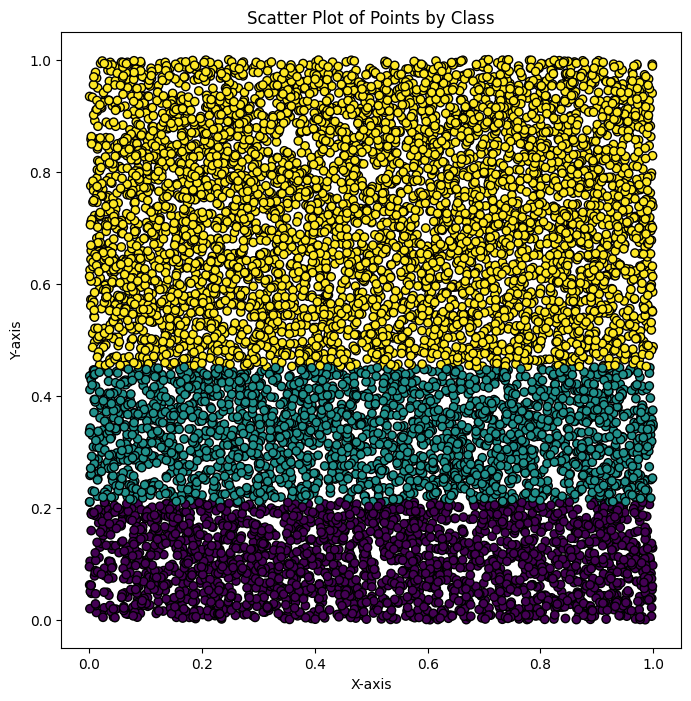

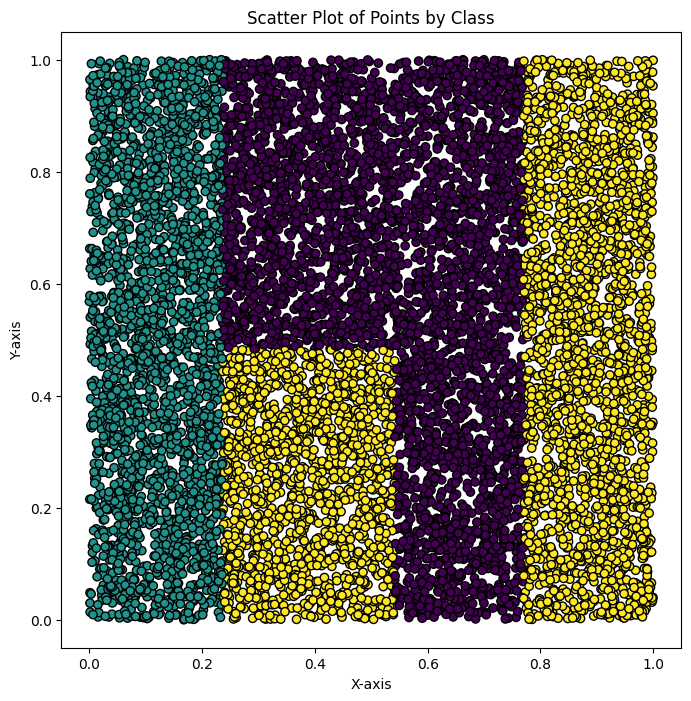

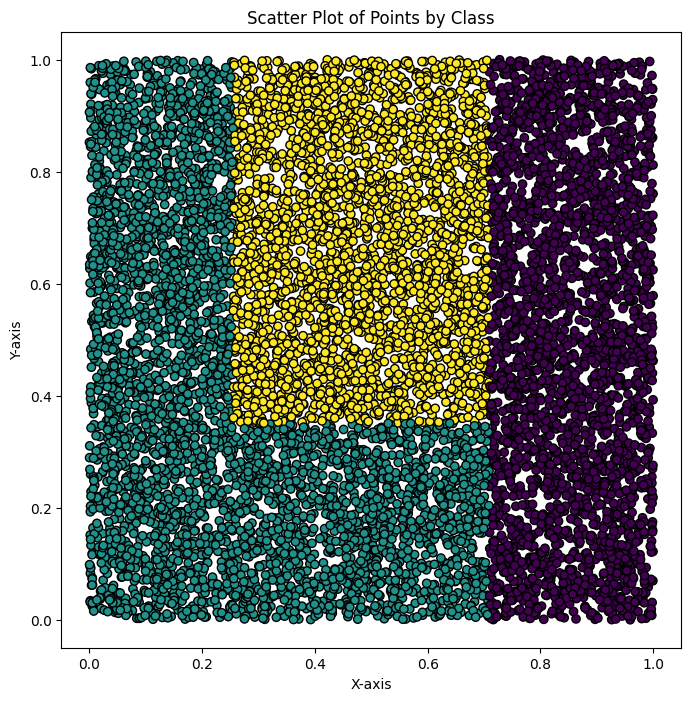

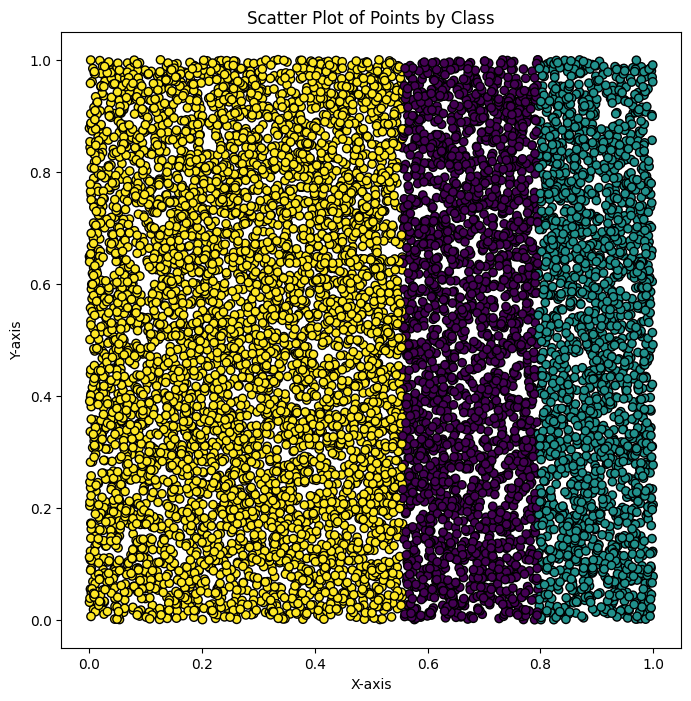

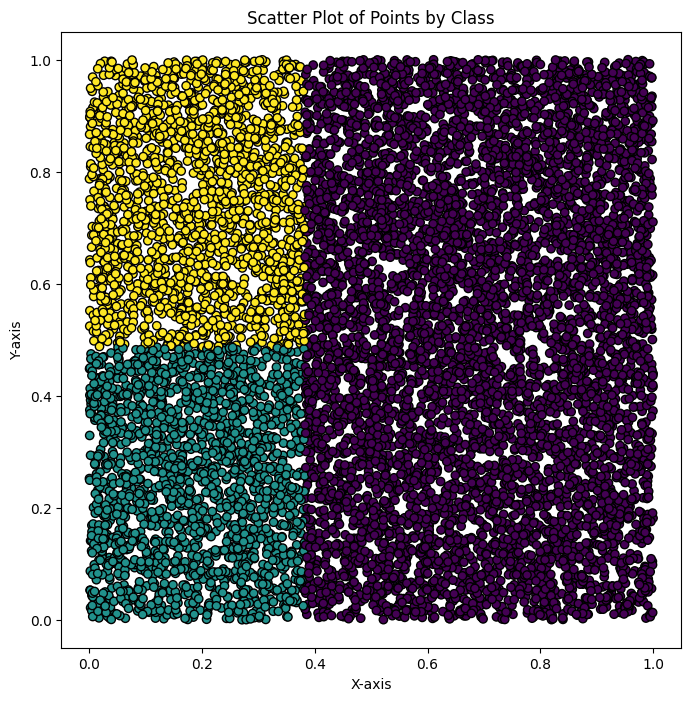

...

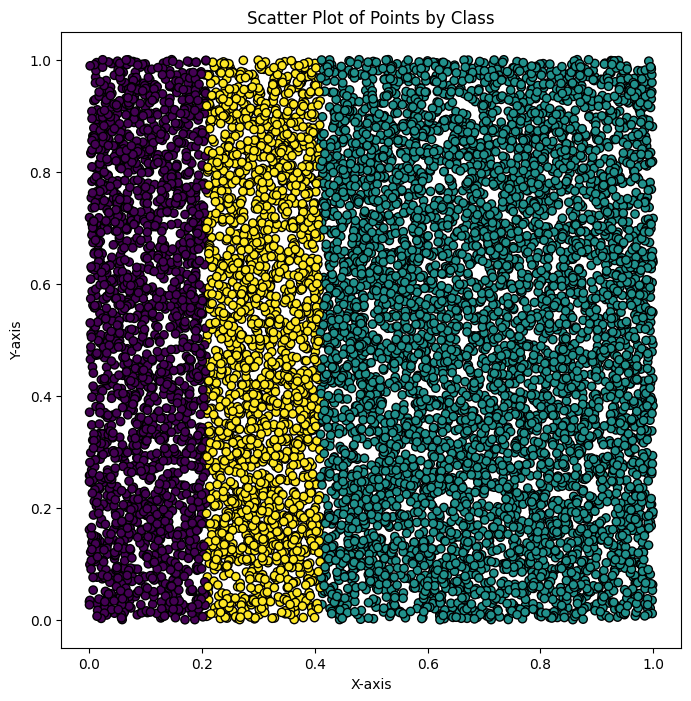

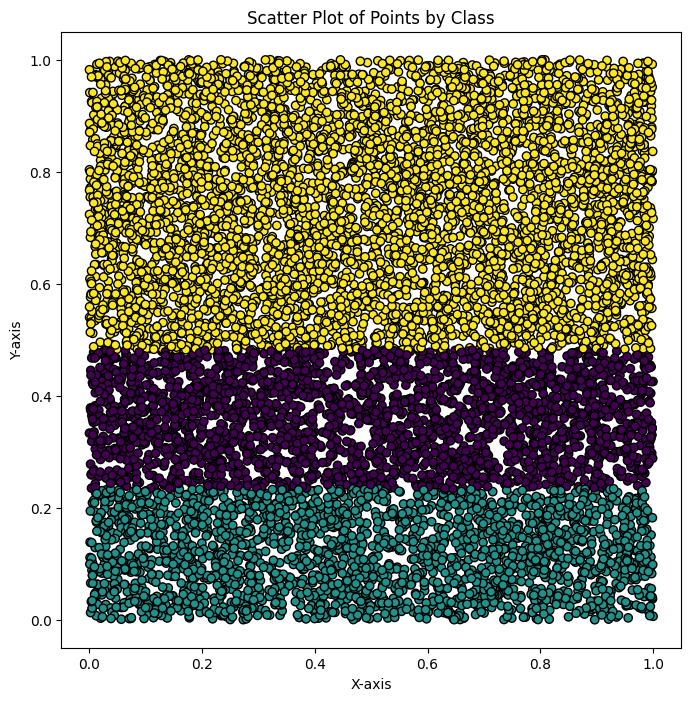

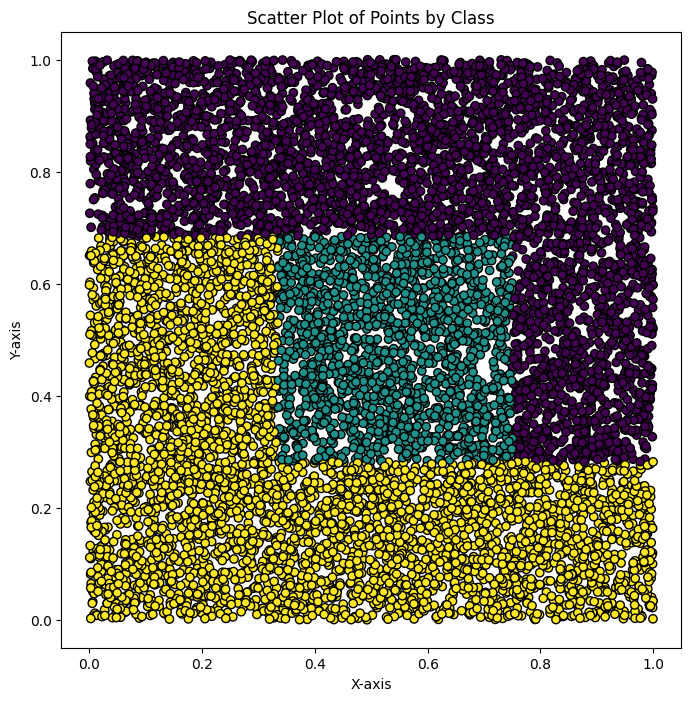

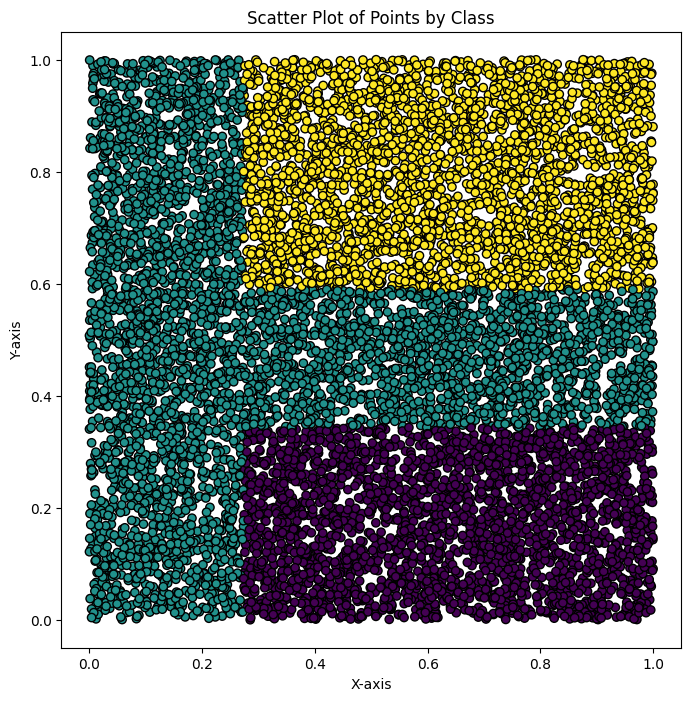

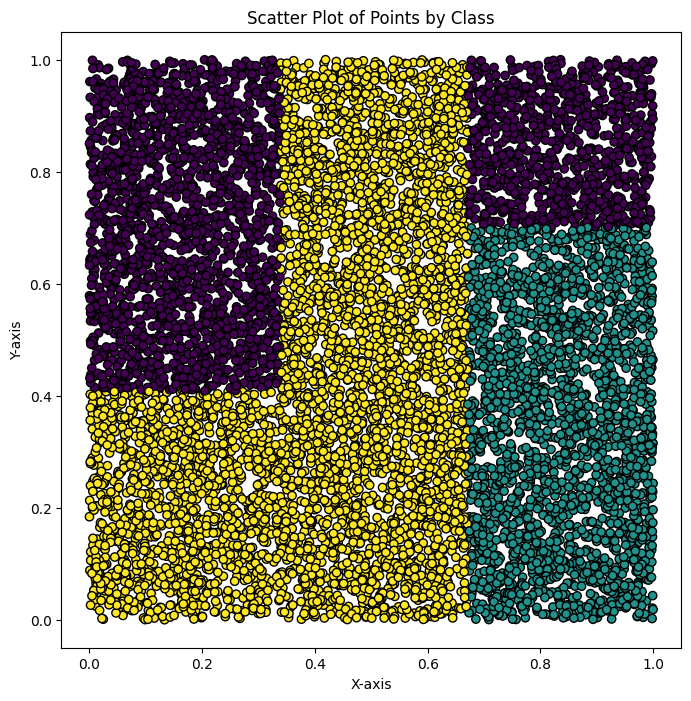

In [12]:
# for seed in [43, 34, 17, 13, 22]:#[17, 22, 34, 26, 27]
#     endA = 0.3 
# for seed in [34, 35, 18, 2, 47]:
#     endA = 0.2 
for seed in range(20): 
    endA = 0.3
    draw_world_from_seed(seed, features = 2, NUMBER_OF_CLASSES = 3, endT = .2, endA = endA, max_depth = 4)